In [ ]:
import json
from pathlib import Path
from collections import defaultdict
import random
import shutil

import pandas as pd
from PIL import Image
from sklearn.model_selection import train_test_split


# -------------------
# Config
# -------------------
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp"}
CLASS_ID = 0  # smoke
TARGET = 640  # 640x640

DATA_DIR = Path("/kaggle/input/detection-iamges")
ANNOT_PATH = DATA_DIR / "all.csv"
OUT_DIR = Path("/kaggle/working/smoke-yolo-640")  # <-- خروجی padded اینجاست

VAL_SIZE = 0.1
TEST_SIZE = 0.1
SEED = 42


# -------------------
# Helpers
# -------------------
def find_shape_col(df: pd.DataFrame) -> str | None:
    for c in df.columns:
        if str(c).strip().lower() == "region_shape_attributes":
            return c
    for c in df.columns:
        cl = str(c).strip().lower()
        if "region" in cl and "shape" in cl:
            return c
    return None


def parse_region(s):
    """VIA region_shape_attributes JSON -> x,y,w,h"""
    if pd.isna(s) or not isinstance(s, str) or s.strip() == "":
        return pd.Series([None, None, None, None])
    try:
        d = json.loads(s)
    except Exception:
        return pd.Series([None, None, None, None])
    return pd.Series([d.get("x"), d.get("y"), d.get("width"), d.get("height")])


def build_image_index(root: Path) -> dict[str, Path]:
    """Map filename -> full path (warn on duplicates)"""
    buckets = defaultdict(list)
    for p in root.rglob("*"):
        if p.suffix.lower() in IMG_EXTS:
            buckets[p.name].append(p)

    index = {}
    dup = 0
    for name, paths in buckets.items():
        if len(paths) == 1:
            index[name] = paths[0]
        else:
            dup += 1
            # deterministic pick
            paths = sorted(paths, key=lambda x: len(str(x)))
            index[name] = paths[0]

    if dup:
        print(f"⚠️ Warning: {dup} duplicate filenames found. Using one path per name (shortest path).")
    print("Found image files:", len(index))
    return index


def load_annotations(annot_path: Path) -> pd.DataFrame:
    df = pd.read_excel(annot_path) if annot_path.suffix.lower() in [".xls", ".xlsx"] else pd.read_csv(annot_path)

    bbox_cols = {"bbox_x", "bbox_y", "bbox_w", "bbox_h"}
    if bbox_cols.issubset(df.columns):
        for c in ["bbox_x", "bbox_y", "bbox_w", "bbox_h"]:
            df[c] = pd.to_numeric(df[c], errors="coerce")
        return df

    shape_col = find_shape_col(df)
    if shape_col is None:
        raise KeyError(f"No bbox columns or region_shape_attributes found. Columns: {df.columns.tolist()}")

    shape_df = df[shape_col].apply(parse_region)
    shape_df.columns = ["bbox_x", "bbox_y", "bbox_w", "bbox_h"]
    df = pd.concat([df.drop(columns=[shape_col]), shape_df], axis=1)

    for c in ["bbox_x", "bbox_y", "bbox_w", "bbox_h"]:
        df[c] = pd.to_numeric(df[c], errors="coerce")
    return df


def letterbox_params(w: int, h: int, new: int = 640):
    """scale + symmetric padding to fit (new,new) without distortion"""
    scale = min(new / w, new / h)
    new_w = int(round(w * scale))
    new_h = int(round(h * scale))
    pad_x = (new - new_w) // 2
    pad_y = (new - new_h) // 2
    return scale, pad_x, pad_y, new_w, new_h


def save_letterboxed_640(src_path: Path, dst_path: Path, new: int = 640):
    """Save a REAL 640x640 image on disk using resize+zero padding (black)."""
    with Image.open(src_path) as im:
        im = im.convert("RGB")
        w, h = im.size
        scale, pad_x, pad_y, new_w, new_h = letterbox_params(w, h, new=new)

        resized = im.resize((new_w, new_h), Image.BILINEAR)
        canvas = Image.new("RGB", (new, new), (0, 0, 0))  # zero padding
        canvas.paste(resized, (pad_x, pad_y))
        dst_path.parent.mkdir(parents=True, exist_ok=True)
        canvas.save(dst_path)


def get_image_sizes(fnames, image_index):
    sizes = {}
    for fname in fnames:
        p = image_index.get(fname)
        if not p or not p.is_file():
            continue
        try:
            with Image.open(p) as im:
                sizes[fname] = im.size  # (w, h)
        except Exception:
            continue
    return sizes


def to_yolo_labels_letterbox(df: pd.DataFrame, image_sizes: dict, new: int = 640):
    """
    Convert original pixel bboxes -> letterboxed(640) pixel bboxes -> YOLO normalized (wrt 640)
    Output: dict[filename] = [ "cls xc yc w h", ... ]
    """
    yolo = defaultdict(list)

    for row in df.itertuples(index=False):
        fname = getattr(row, "filename", None)
        if not fname or fname not in image_sizes:
            continue

        x, y, bw, bh = row.bbox_x, row.bbox_y, row.bbox_w, row.bbox_h
        if pd.isna(x) or pd.isna(y) or pd.isna(bw) or pd.isna(bh):
            continue
        if bw <= 0 or bh <= 0:
            continue

        img_w, img_h = image_sizes[fname]
        scale, pad_x, pad_y, _, _ = letterbox_params(img_w, img_h, new=new)

        # original box corners (pixel) with clipping to original image
        x1 = max(0.0, float(x))
        y1 = max(0.0, float(y))
        x2 = min(float(img_w), float(x) + float(bw))
        y2 = min(float(img_h), float(y) + float(bh))
        if (x2 - x1) <= 0 or (y2 - y1) <= 0:
            continue

        # transform into 640-space
        x1 = x1 * scale + pad_x
        x2 = x2 * scale + pad_x
        y1 = y1 * scale + pad_y
        y2 = y2 * scale + pad_y

        # clip to 640
        x1 = max(0.0, min(float(new), x1))
        x2 = max(0.0, min(float(new), x2))
        y1 = max(0.0, min(float(new), y1))
        y2 = max(0.0, min(float(new), y2))
        if (x2 - x1) <= 0 or (y2 - y1) <= 0:
            continue

        # YOLO normalized relative to 640
        xc = (x1 + x2) / 2.0 / new
        yc = (y1 + y2) / 2.0 / new
        wn = (x2 - x1) / new
        hn = (y2 - y1) / new

        yolo[fname].append(f"{CLASS_ID} {xc:.6f} {yc:.6f} {wn:.6f} {hn:.6f}")

    return yolo


def verify_all_640(out_dir: Path, splits=("train", "val", "test"), new=640, max_check=300):
    """Hard check: make sure images saved on disk are REALLY 640x640."""
    from PIL import Image

    for split in splits:
        img_dir = out_dir / "images" / split
        imgs = []
        for ext in IMG_EXTS:
            imgs += list(img_dir.rglob(f"*{ext}"))  # not used; ext includes dot

        # easier: just list files in folder
        imgs = [p for p in img_dir.iterdir() if p.suffix.lower() in IMG_EXTS] if img_dir.exists() else []
        print(f"[verify] {split}: {len(imgs)} images")

        bad = []
        for p in imgs[:max_check]:
            with Image.open(p) as im:
                if im.size != (new, new):
                    bad.append((p.name, im.size))
        if bad:
            print(f" {split} has non-640 images (showing up to 5):", bad[:5])
        else:
            print(f"{split} all checked images are {new}x{new}")

        # print a few samples
        for p in random.sample(imgs, k=min(3, len(imgs))):
            with Image.open(p) as im:
                print("   sample:", p.name, im.size)


def prepare_yolo_dataset_padded(
    data_dir: Path,
    annot_path: Path,
    out_dir: Path,
    new: int = 640,
    val_size: float = 0.2,
    test_size: float = 0.1,
    seed: int = 42
):
    out_dir.mkdir(parents=True, exist_ok=True)

    image_index = build_image_index(data_dir)
    df = load_annotations(annot_path)
    print("Annotation rows:", len(df))

    # images considered are those listed in annotations
    fnames = sorted(set(df["filename"].dropna().astype(str)))
    image_sizes = get_image_sizes(fnames, image_index)
    print("Images with size info:", len(image_sizes))

    # labels computed in 640-space
    yolo = to_yolo_labels_letterbox(df, image_sizes, new=new)
    print("Images with at least 1 label:", len(yolo))

    all_imgs = sorted(image_sizes.keys())
    if not all_imgs:
        raise RuntimeError("No images found (check filenames in CSV and dataset paths).")

    # split train/val/test
    # First split out test, then split remaining into train/val
    trainval_imgs, test_imgs = train_test_split(all_imgs, test_size=test_size, random_state=seed, shuffle=True)
    train_imgs, val_imgs = train_test_split(trainval_imgs, test_size=val_size, random_state=seed, shuffle=True)

    print("Split sizes => train:", len(train_imgs), "val:", len(val_imgs), "test:", len(test_imgs))

    # create dirs
    for sub in ["images/train", "images/val", "images/test", "labels/train", "labels/val", "labels/test"]:
        (out_dir / sub).mkdir(parents=True, exist_ok=True)

    def write_split(img_list, split_name):
        img_out = out_dir / "images" / split_name
        lbl_out = out_dir / "labels" / split_name

        for fname in img_list:
            src = image_index.get(fname)
            if not src or not src.is_file():
                continue

            # save real 640x640
            dst_img = img_out / fname
            save_letterboxed_640(src, dst_img, new=new)

            # write label (may be empty)
            lbl_path = lbl_out / (Path(fname).stem + ".txt")
            lines = yolo.get(fname, [])
            lbl_path.write_text("\n".join(lines))

    write_split(train_imgs, "train")
    write_split(val_imgs, "val")
    write_split(test_imgs, "test")

    # create data.yml based on padded dataset
    data_yml = f"""
path: {out_dir}
train: images/train
val: images/val
test: images/test

nc: 1
names: ['smoke']
""".strip()

    (out_dir / "data.yml").write_text(data_yml)
    print("\n Dataset READY (padded) at:", out_dir)
    print(" data.yml created at:", out_dir / "data.yml")
    print("\n--- data.yml ---\n" + data_yml)

    # hard verify that on disk images are truly 640x640
    verify_all_640(out_dir, splits=("train", "val", "test"), new=new)


# -------------------
# Run
# -------------------
prepare_yolo_dataset_padded(
    data_dir=DATA_DIR,
    annot_path=ANNOT_PATH,
    out_dir=OUT_DIR,
    new=TARGET,
    val_size=VAL_SIZE,
    test_size=TEST_SIZE,
    seed=SEED
)


In [ ]:
!pip install -U ultralytics

from ultralytics import YOLO

model = YOLO("yolov9e.pt")  
model.info()

In [ ]:
from ultralytics import YOLO
from pathlib import Path
import shutil

DATA_YML = "/kaggle/working/smoke-yolo-640/data.yml"

model = YOLO("yolov9e.pt")

train_res = model.train(
    data=DATA_YML,
    imgsz=640,
    epochs=100,
    batch=8,
    device=0,
    plots=True,
    save=True,   # ذخیره weights
)

# فولدر خروجی run
save_dir = Path(model.trainer.save_dir)
weights_dir = save_dir / "weights"

last_pt = weights_dir / "last.pt"   # آخرین اپوک
best_pt = weights_dir / "best.pt"   # بهترین

print("Run dir:", save_dir)
print("Last weights:", last_pt, "exists:", last_pt.exists())
print("Best weights:", best_pt, "exists:", best_pt.exists())

# کپی last.pt با نام دلخواه (برای اینکه گم نشه)
final_out = Path("/kaggle/working") / "yolov9e_smoke_last.pt"
if last_pt.exists():
    shutil.copy2(last_pt, final_out)
    print("Saved final last weights to:", final_out)
else:
    print("last.pt not found! Check training run output.")


In [11]:
!pip install -U ultralytics

In [ ]:
from ultralytics import YOLO
from pathlib import Path
import matplotlib.pyplot as plt

weights = Path("/kaggle/input/model-weight/yolov9e_smoke_last.pt")
if not weights.exists():
    cands = sorted(Path("/kaggle/working").rglob("last.pt"), key=lambda p: p.stat().st_mtime, reverse=True)
    if not cands:
        raise FileNotFoundError("no last.pt found in /kaggle/working")
    weights = cands[0]

src_dir = Path("/kaggle/input/visual")
imgs = []
for ext in (".jpg", ".jpeg", ".png", ".bmp"):
    imgs += list(src_dir.glob(f"*{ext}"))
imgs = sorted(imgs)
if len(imgs) != 3:
    print("found images:", len(imgs), [p.name for p in imgs])

model = YOLO(str(weights))
results = model.predict(source=[str(p) for p in imgs], imgsz=640, conf=0.2, iou=0.7)

plt.figure(figsize=(15, 5))
for i, r in enumerate(results):
    im = r.plot()
    plt.subplot(1, 3, i + 1)
    plt.imshow(im)
    plt.axis("off")
    plt.title(Path(r.path).name)
plt.tight_layout()
plt.show()

Ultralytics 8.3.248 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9e summary (fused): 279 layers, 57,377,171 parameters, 0 gradients, 189.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 909.9±373.3 MB/s, size: 30.0 KB)
val: Scanning /kaggle/working/test_eval_640/labels/test... 42 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 42/42 1.5Kit/s 0.0s
val: New cache created: /kaggle/working/test_eval_640/labels/test.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.2s/it 3.5s2.5s
                   all         42         56       0.82      0.679      0.776      0.333
Speed: 4.4ms preprocess, 69.2ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to /kaggle/working/val_test_with_label_all


,images,mAP50,mAP50-95,precision,recall
0,42,0.776278,0.332843,0.819663,0.678571


Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:3 https://cli.github.com/packages stable InRelease [3,917 B]
Get:4 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Hit:5 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:6 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:7 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [2,227 kB]
Get:8 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Hit:9 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Get:10 https://r2u.stat.illinois.edu/ubuntu jammy/main all Packages [9,576 kB]
Hit:11 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:12 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:13 https://r2u.stat.illinois.edu/ubuntu jammy/main amd6

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)



Building dependency tree...
Reading state information...
The following NEW packages will be installed:
  fonts-dejavu-core
0 upgraded, 1 newly installed, 0 to remove and 101 not upgraded.
Need to get 1,041 kB of archives.
After this operation, 3,025 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 fonts-dejavu-core all 2.37-2build1 [1,041 kB]
Fetched 1,041 kB in 0s (3,786 kB/s)
Selecting previously unselected package fonts-dejavu-core.
(Reading database ... 129073 files and directories currently installed.)
Preparing to unpack .../fonts-dejavu-core_2.37-2build1_all.deb ...
Unpacking fonts-dejavu-core (2.37-2build1) ...
Setting up fonts-dejavu-core (2.37-2build1) ...
Processing triggers for fontconfig (2.13.1-4.2ubuntu5) ...


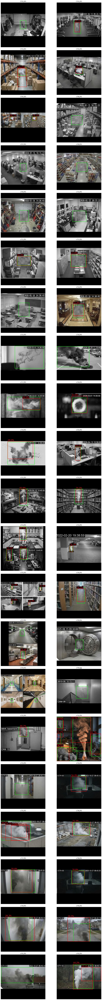

weights: /kaggle/input/model-weight/yolov9e_smoke_last.pt
json: /kaggle/input/test-with-label/test42.json
padded_eval_dir: /kaggle/working/test_eval_640
visual_outputs: /kaggle/working/test_vis_all
num_images: 42
font_path: /usr/share/fonts/truetype/dejavu/DejaVuSans.ttf font_size: 28


In [19]:
from pathlib import Path
from collections import defaultdict
import json
import shutil
import math
import subprocess
import pandas as pd
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
from ultralytics import YOLO

IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp"}
target = 640

src_dir = Path("/kaggle/input/test-with-label")
work_dir = Path("/kaggle/working/test_eval_640")
if work_dir.exists():
    shutil.rmtree(work_dir)

img_out = work_dir / "images" / "test"
lbl_out = work_dir / "labels" / "test"
img_out.mkdir(parents=True, exist_ok=True)
lbl_out.mkdir(parents=True, exist_ok=True)

weights = Path("/kaggle/input/model-weight/yolov9e_smoke_last.pt")
if not weights.exists():
    cands = sorted(Path("/kaggle/working").rglob("last.pt"), key=lambda p: p.stat().st_mtime, reverse=True)
    if not cands:
        raise FileNotFoundError("No weights found")
    weights = cands[0]

json_candidates = sorted(list(src_dir.glob("*.json")))
json_path = json_candidates[0] if json_candidates else Path("/mnt/data/test42.json")
if not json_path.exists():
    raise FileNotFoundError("No JSON labels found")

img_paths = [p for p in src_dir.iterdir() if p.is_file() and p.suffix.lower() in IMG_EXTS]
img_paths = sorted(img_paths)
if not img_paths:
    raise FileNotFoundError("No images found in /kaggle/input/test-with-label")

with open(json_path, "r") as f:
    data = json.load(f)

items = list(data.values()) if isinstance(data, dict) else list(data)

gt_by_name = defaultdict(list)
gt_by_stem = defaultdict(list)

for it in items:
    if not isinstance(it, dict):
        continue
    fname = it.get("filename")
    if not fname:
        continue
    key_name = Path(str(fname)).name
    key_stem = Path(str(fname)).stem
    regs = it.get("regions", [])
    if isinstance(regs, dict):
        regs = list(regs.values())
    for r in regs:
        if not isinstance(r, dict):
            continue
        sa = r.get("shape_attributes", {})
        if not isinstance(sa, dict):
            continue
        if sa.get("name") != "rect":
            continue
        x = sa.get("x", None)
        y = sa.get("y", None)
        w = sa.get("width", None)
        h = sa.get("height", None)
        if x is None or y is None or w is None or h is None:
            continue
        box = (float(x), float(y), float(w), float(h))
        gt_by_name[key_name].append(box)
        gt_by_stem[key_stem].append(box)

def letterbox_params(w, h, new=640):
    s = min(new / w, new / h)
    nw = int(round(w * s))
    nh = int(round(h * s))
    px = (new - nw) // 2
    py = (new - nh) // 2
    return s, px, py, nw, nh

def save_letterbox_640(src, dst, new=640):
    with Image.open(src) as im:
        im = im.convert("RGB")
        w, h = im.size
        s, px, py, nw, nh = letterbox_params(w, h, new)
        resized = im.resize((nw, nh), Image.BILINEAR)
        canvas = Image.new("RGB", (new, new), (0, 0, 0))
        canvas.paste(resized, (px, py))
        canvas.save(dst)
    return w, h, s, px, py

def gt_to_yolo_640(gt_list, orig_w, orig_h, s, px, py, new=640):
    lines = []
    gt_640 = []
    for x, y, w, h in gt_list:
        x1 = max(0.0, x)
        y1 = max(0.0, y)
        x2 = min(float(orig_w), x + w)
        y2 = min(float(orig_h), y + h)
        bw = x2 - x1
        bh = y2 - y1
        if bw <= 0 or bh <= 0:
            continue
        x1 = x1 * s + px
        x2 = x2 * s + px
        y1 = y1 * s + py
        y2 = y2 * s + py
        x1 = max(0.0, min(float(new), x1))
        x2 = max(0.0, min(float(new), x2))
        y1 = max(0.0, min(float(new), y1))
        y2 = max(0.0, min(float(new), y2))
        bw2 = x2 - x1
        bh2 = y2 - y1
        if bw2 <= 0 or bh2 <= 0:
            continue
        xc = (x1 + x2) / 2.0 / new
        yc = (y1 + y2) / 2.0 / new
        wn = bw2 / new
        hn = bh2 / new
        xc = max(0.0, min(1.0, xc))
        yc = max(0.0, min(1.0, yc))
        wn = max(0.0, min(1.0, wn))
        hn = max(0.0, min(1.0, hn))
        lines.append(f"0 {xc:.6f} {yc:.6f} {wn:.6f} {hn:.6f}")
        gt_640.append((x1, y1, x2, y2))
    return lines, gt_640

gt640_cache = {}
for p in img_paths:
    out_img = img_out / p.name
    orig_w, orig_h, s, px, py = save_letterbox_640(p, out_img, new=target)
    gt_list = gt_by_name.get(p.name, None)
    if not gt_list:
        gt_list = gt_by_stem.get(p.stem, [])
    yolo_lines, gt640 = gt_to_yolo_640(gt_list, orig_w, orig_h, s, px, py, new=target)
    (lbl_out / f"{p.stem}.txt").write_text("\n".join(yolo_lines))
    gt640_cache[p.name] = gt640

data_yml = work_dir / "data.yml"
data_yml.write_text(
    "\n".join([
        f"path: {work_dir}",
        "train: images/test",
        "val: images/test",
        "test: images/test",
        "nc: 1",
        "names: ['smoke']",
    ])
)

model = YOLO(str(weights))

val_metrics = model.val(
    data=str(data_yml),
    imgsz=640,
    split="test",
    project="/kaggle/working",
    name="val_test_with_label_all",
    exist_ok=True
)

rd = getattr(val_metrics, "results_dict", {}) or {}
map50 = rd.get("metrics/mAP50(B)", None)
map5095 = rd.get("metrics/mAP50-95(B)", None)
prec = rd.get("metrics/precision(B)", None)
rec = rd.get("metrics/recall(B)", None)

if (map50 is None or map5095 is None or prec is None or rec is None) and hasattr(val_metrics, "box"):
    map50 = float(getattr(val_metrics.box, "map50", float("nan")))
    map5095 = float(getattr(val_metrics.box, "map", float("nan")))
    prec = float(getattr(val_metrics.box, "mp", float("nan")))
    rec = float(getattr(val_metrics.box, "mr", float("nan")))

metrics_df = pd.DataFrame([{
    "images": len(img_paths),
    "mAP50": float(map50),
    "mAP50-95": float(map5095),
    "precision": float(prec),
    "recall": float(rec),
}])
display(metrics_df)

pred_results = model.predict(
    source=str(img_out),
    imgsz=640,
    conf=0.25,
    iou=0.7,
    save=False,
    verbose=False
)

vis_dir = Path("/kaggle/working/test_vis_all")
if vis_dir.exists():
    shutil.rmtree(vis_dir)
vis_dir.mkdir(parents=True, exist_ok=True)

font_paths = [
    "/usr/share/fonts/truetype/dejavu/DejaVuSans.ttf",
    "/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf",
]
font_path = next((p for p in font_paths if Path(p).exists()), None)

if font_path is None:
    subprocess.run(["apt-get", "update", "-y"], check=False)
    subprocess.run(["apt-get", "install", "-y", "fonts-dejavu-core"], check=False)
    font_path = next((p for p in font_paths if Path(p).exists()), None)

font_size = 28
font = ImageFont.truetype(font_path, font_size) if font_path else ImageFont.load_default()

pred_color = (255, 0, 0)
gt_color = (0, 255, 0)

def draw_big_text(draw, x, y, text, font, fill):
    x = int(x)
    y = int(y)
    bb = draw.textbbox((x, y), text, font=font)
    draw.rectangle([bb[0]-4, bb[1]-4, bb[2]+4, bb[3]+4], fill=(0, 0, 0))
    draw.text((x, y), text, font=font, fill=fill)

saved = []
for r in pred_results:
    p = Path(r.path)
    with Image.open(p) as im:
        im = im.convert("RGB")
        draw = ImageDraw.Draw(im)

        for (x1, y1, x2, y2) in gt640_cache.get(p.name, []):
            draw.rectangle([x1, y1, x2, y2], outline=gt_color, width=3)

        if r.boxes is not None and len(r.boxes) > 0:
            xyxy = r.boxes.xyxy.cpu().numpy()
            confs = r.boxes.conf.cpu().numpy()
            for (x1, y1, x2, y2), c in zip(xyxy, confs):
                x1, y1, x2, y2 = map(float, (x1, y1, x2, y2))
                draw.rectangle([x1, y1, x2, y2], outline=pred_color, width=3)

                text = f"{c*100:.1f}%"
                tx = max(0, min(target - 1, int(x1 + 3)))
                ty = int(y1 - (font_size + 6))
                if ty < 0:
                    ty = min(target - (font_size + 6), int(y1 + 3))
                draw_big_text(draw, tx, ty, text, font=font, fill=pred_color)

        out_path = vis_dir / p.name
        im.save(out_path)
        saved.append(out_path)

saved = sorted(saved)
n = len(saved)
cols = 2 if n > 1 else 1
rows = (n + cols - 1) // cols

plt.figure(figsize=(8 * cols, 6 * rows))
for i in range(n):
    im = Image.open(saved[i]).convert("RGB")
    plt.subplot(rows, cols, i + 1)
    plt.imshow(im)
    plt.axis("off")
    plt.title(saved[i].name)
plt.tight_layout()
plt.show()

print("weights:", weights)
print("json:", json_path)
print("padded_eval_dir:", work_dir)
print("visual_outputs:", vis_dir)
print("num_images:", len(img_paths))
print("font_path:", font_path, "font_size:", font_size)


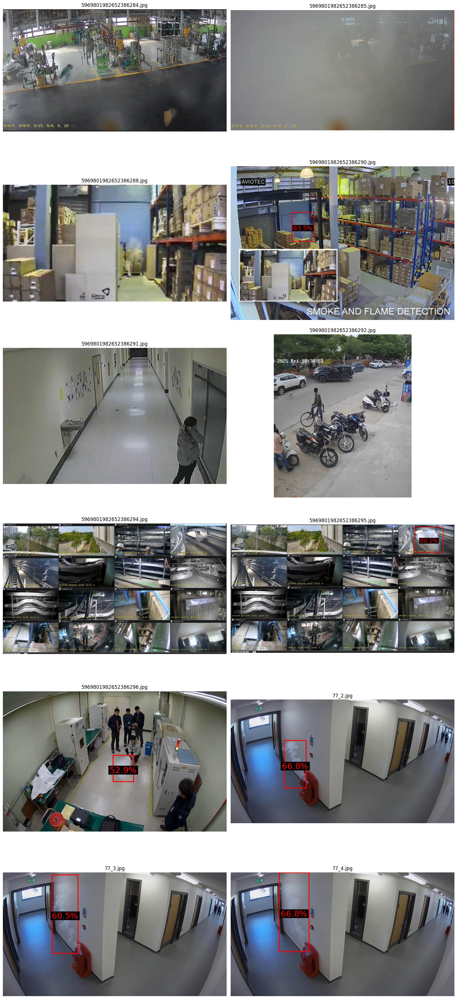

weights: /kaggle/input/model-weight/yolov9e_smoke_last.pt
input_images: 12
visual_outputs: /kaggle/working/visual_pred


In [26]:
from pathlib import Path
import shutil
import math
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
from ultralytics import YOLO

IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp"}

weights = Path("/kaggle/input/model-weight/yolov9e_smoke_last.pt")
if not weights.exists():
    raise FileNotFoundError(str(weights))

src_dir = Path("/kaggle/input/visual")
img_paths = [p for p in src_dir.iterdir() if p.is_file() and p.suffix.lower() in IMG_EXTS]
img_paths = sorted(img_paths)
if not img_paths:
    raise FileNotFoundError("No images found in /kaggle/input/visual")

model = YOLO(str(weights))

pred_results = model.predict(
    source=[str(p) for p in img_paths],
    imgsz=640,
    conf=0.35,
    iou=0.7,
    save=False,
    verbose=False
)

vis_dir = Path("/kaggle/working/visual_pred")
if vis_dir.exists():
    shutil.rmtree(vis_dir)
vis_dir.mkdir(parents=True, exist_ok=True)

font_path = "/usr/share/fonts/truetype/dejavu/DejaVuSans.ttf"
font_size = 28
font = ImageFont.truetype(font_path, font_size) if Path(font_path).exists() else ImageFont.load_default()

pred_color = (255, 0, 0)

def draw_text_centered(draw, x_center, y_center, text, font, fill):
    bb = draw.textbbox((0, 0), text, font=font)
    tw = bb[2] - bb[0]
    th = bb[3] - bb[1]
    tx = int(x_center - tw / 2)
    ty = int(y_center - th / 2)
    bb2 = draw.textbbox((tx, ty), text, font=font)
    draw.rectangle([bb2[0]-4, bb2[1]-4, bb2[2]+4, bb2[3]+4], fill=(0, 0, 0))
    draw.text((tx, ty), text, font=font, fill=fill)

saved = []
for r in pred_results:
    p = Path(r.path)
    with Image.open(p) as im:
        im = im.convert("RGB")
        w, h = im.size
        draw = ImageDraw.Draw(im)

        if r.boxes is not None and len(r.boxes) > 0:
            xyxy = r.boxes.xyxy.cpu().numpy()
            confs = r.boxes.conf.cpu().numpy()
            for (x1, y1, x2, y2), c in zip(xyxy, confs):
                x1, y1, x2, y2 = map(float, (x1, y1, x2, y2))
                draw.rectangle([x1, y1, x2, y2], outline=pred_color, width=3)

                text = f"{c*100:.1f}%"
                xc = (x1 + x2) / 2.0
                yc = (y1 + y2) / 2.0
                xc = max(0.0, min(float(w), xc))
                yc = max(0.0, min(float(h), yc))
                draw_text_centered(draw, xc, yc, text, font=font, fill=pred_color)

        out_path = vis_dir / p.name
        im.save(out_path)
        saved.append(out_path)

saved = sorted(saved)
n = len(saved)
cols = 2 if n > 1 else 1
rows = (n + cols - 1) // cols

plt.figure(figsize=(8 * cols, 6 * rows))
for i in range(n):
    im = Image.open(saved[i]).convert("RGB")
    plt.subplot(rows, cols, i + 1)
    plt.imshow(im)
    plt.axis("off")
    plt.title(saved[i].name)
plt.tight_layout()
plt.show()

print("weights:", weights)
print("input_images:", len(img_paths))
print("visual_outputs:", vis_dir)
